In [6]:
from tqdm.notebook import tqdm
import os
from glob import glob
import json
import matplotlib.pyplot as plt
from typing import List, Dict, Tuple, Union

import albumentations as A
from multiprocessing.pool import ThreadPool
import cv2
import numpy as np
import torch
from torch import nn 
from torchvision.ops import DeformConv2d 
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader

import pycocotools.coco as coco
from pycocotools.cocoeval import COCOeval

In [7]:
class Baseset(Dataset):

    def __init__(self, folders: List[str], h: int, w: int, cache=False,
        transform=None):
        super().__init__()
        self.folders = folders  # e.g. ['data/F0', ...]
        self.h = h  # image height
        self.w = w  # image width
        self.cache = cache  # store images as path string or np.ndarray 
        self.transform = transform
        
        self.data = self.extract_data(folders)
        self.size = len(self.data)
        if cache:
            self.cache_images()

    def cache_images(self): 
        results = ThreadPool(4).imap(self.imread, (lane['images'] for lane in self.data))
        pbar = tqdm(enumerate(results), total=self.size)
        gb = 0
        for lane_nr, lane_images in pbar:
            self.data[lane_nr]['images'] = lane_images  
            gb += lane_images.nbytes
            pbar.desc = f'Caching images ({gb/1E9:.1f}GB)'

    @staticmethod
    def extract_data(folders: List[str]):
        '''
        extract the relevant information from the folder structure and 
        cluster it lane-wise:

        [{'images': [('.../some_name.tiff', ...], 
          'poses': [pose_M3x4, ...],
          'annotated_image': integer_index, 
          'polys': [[...]], }, 
         {...}, ...]
        
        note: for each image there exists a pose, per lane there are bbox 
        annotations for a single image (bboxes make sense after integration)
        ''' 
        data = []  # each lane is a element (dictionary) in the 'data' list
        for folder_path in folders:
            pose_files = sorted(glob(os.path.join(folder_path, 'Poses', '*.json')))
            label_files = sorted(glob(os.path.join(folder_path, 'Labels', '*.json')))
            for pose_file, label_file in zip(pose_files, label_files):
                lane = {}
                poses = json.load(open(pose_file, 'rb'))['images']
                labels = json.load(open(label_file, 'rb'))['Labels']
                lane_nr = os.path.splitext(os.path.basename(pose_file))[0]
                base_path = os.path.join(folder_path, 'Images', lane_nr)

                image_paths = []
                pose_matrices = []
                for pose in poses:
                    image_paths.append(os.path.join(base_path, pose['imagefile']))
                    pose_matrices.append(np.asarray(pose['M3x4']))

                polys = []
                if isinstance(labels, list) and len(labels):  
                    for label in labels:
                        polys.append(label['poly'])
                    # each lane has a single annotated image (the integral image)
                    lane['annotated_image'] = image_paths.index(os.path.join(base_path, 
                        labels[0]['imagefile']))  
                    # polygons: [ [[x1, y1], ...next point], ...next polygon ]
                    lane['polys'] = polys
                else:  # otherwise empty => no annotations (no humans)
                    lane['annotated_image'] = lane['polys'] = None

                # we have the camera extrinsics for each image in the lane
                lane['images'] = image_paths
                lane['poses'] = pose_matrices

                data.append(lane)  # each pose and label file correspondes to a lane
                
        return data

    @staticmethod
    def show_images(images: np.ndarray, mask: np.ndarray = None, figsize=None):
        fig = plt.figure(figsize=figsize)
        if mask is not None:  # k,
            images = images[mask, ...]  # k x h x w
        images = torch.as_tensor(images).unsqueeze(1)  # n(k) x 1 x h x w
        grid = make_grid(images, nrow=int(np.sqrt(images.size(0))))  # 3 x h x w
        plt.imshow(grid.permute(1, 2, 0))
        plt.axis('off')
        plt.show()

    @staticmethod
    def show_image(image: np.ndarray, cmap: str = 'gray', figsize=None):
        fig = plt.figure(figsize=figsize)
        plt.imshow(image, cmap=cmap)
        plt.axis('off')
        plt.show()

    @staticmethod
    def load_camera_params(param_folder: str = 'calibration/parameters'):
        ''' Camera intrinsics K and distortion coefficients. '''
        K = np.load(os.path.join(param_folder, 'K.npy'))
        dist_coeffs = np.load(os.path.join(param_folder, 'dist_coeffs.npy'))
        return K, dist_coeffs

    @staticmethod
    def imread(paths: List[str], K=None, dist_coeffs=None) -> np.ndarray:
        images = []
        for path in paths:
            image = cv2.imread(path, cv2.IMREAD_ANYDEPTH)  # 16 bit image
            image = cv2.normalize(image, dst=None, alpha=0, beta=2**16 - 1, 
                norm_type=cv2.NORM_MINMAX)
            image = (image >> 8).astype(np.uint8)  # 8 bit image
            
            if K is not None and dist_coeffs is not None:  # undistort images
                h, w = image.shape
                # new camera intrinsics based on free scaling parameter
                refined_K, roi = cv2.getOptimalNewCameraMatrix(K, dist_coeffs, 
                    (w, h), 1, (w, h))
                x, y, w, h = roi
                image = image[y:y+h, x:x+w]
                image = cv2.undistort(image, K, dist_coeffs, None, refined_K)
            
            images.append(image)

        return np.asarray(images)  # n_paths x h x w

    @staticmethod
    def integrate(images: Union[List[str], np.ndarray], pose_matrices: List[np.ndarray], 
        K: np.ndarray, z: float = 30.0, idc: int = None, verbose=False) -> Tuple[np.ndarray, np.ndarray]:
        '''
        integral :=
        a mapping of a image sequence under perspective to another image view

        images contains the image file paths or the np.ndarray images and pose_matrices 
        the M3x4 matrices where M3x4 = (R3x3, t3x1) => thus without intrinsics K

        z is the height of the camera (drone) in meters (units must be the same
        as used when calculating the extrinsics)
        '''
        sequence_len = len(images)

        if idc is None:  # otherwise given and must not be at the center
            idc = sequence_len // 2  # index of center image = center of images (if odd length)
        
        if isinstance(images, list):  # otherwise np.ndarray => already images
            images = Baseset.imread(images)  # 8 bit images from path
        
        h, w = images.shape[1:]  # gray scale images
        integral = np.zeros((h, w), np.float64)
        
        # inverse of the intrinsic mapping
        K_inv = np.linalg.inv(K)

        Mc = pose_matrices[idc]
        Rc = Mc[:, :3]  # 3 x 3
        tc = Mc[:, 3:]  # 3 x 1

        for idx in range(sequence_len):
            if idx != idc:
                Mr = pose_matrices[idx]  # 3 x 4
                Rr = Mr[:, :3]  # 3 x 3
                tr = Mr[:, 3:]  # 3 x 1

                # relative translation and rotation
                R_rel = Rc @ Rr.T  # 3 x 3
                t_rel = tc - R_rel @ tr  # 3 x 1

                B = K @ R_rel @ K_inv
                B[:, 2:] += K @ t_rel / z
                warped = cv2.warpPerspective(images[idx], B, (w, h))

                if verbose:
                    Baseset.show_image(warped)

                integral += warped
            else:
                if verbose:
                    Baseset.show_image(images[idx])

                integral += images[idx]

        integral /= sequence_len
        # 8 bit gray scale integral image
        integral = cv2.normalize(integral, None, 
            0, 255, cv2.NORM_MINMAX).astype(np.uint8)

        # returns (image sequence, integral image)
        return images, integral  

    def __len__(self):
        return self.size

    def _float(self, x: float):
        return float(f'{x:0.2f}')


class IntegralDataset(Baseset):
    ''' For training and testing of the deep learning based integration. '''

    def __init__(self, folders: List[str], h: int, w: int, sequence_len=5,
        cache=False, transform=None, random_select=True):
        super().__init__(folders, h, w, cache, transform)
        self.sequence_len = sequence_len
        self.K, _ = self.load_camera_params()
        self.random_select = random_select

    def __getitem__(self, idx):
        lane = self.data[idx]  # select lane

        if self.random_select:  # randomly select adjacent images and correspondig poses 
            start = np.random.randint(len(lane['images']) - self.sequence_len)
        else:  # choose annotated image as center
            start = lane['annotated_image'] - self.sequence_len // 2
        images = lane['images'][start:start + self.sequence_len]
        pose_matrices = lane['poses'][start:start + self.sequence_len]
        image_sequence, integral_image = self.integrate(images, pose_matrices, self.K)

        if self.transform is not None:
            # data augmentation on images
            image_sequence, integral_image = self.transform(image_sequence, integral_image)
        
        return image_sequence, integral_image

In [8]:
# test the implementation of the integration dataset:
folders = [f'data/F{i}' for i in range(12)]
h, w = 512, 640
ids = IntegralDataset(folders, h, w, sequence_len=5, cache=True, transform=None, random_select=False)

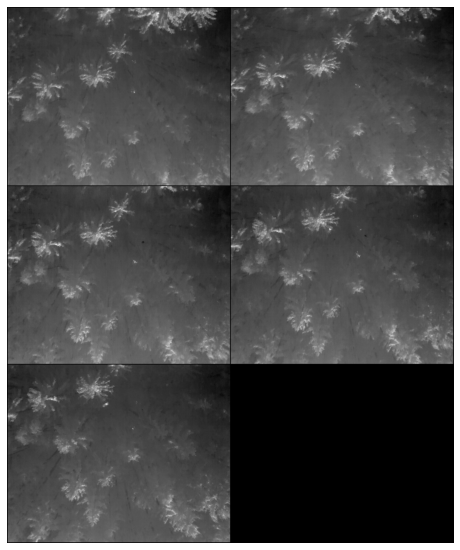

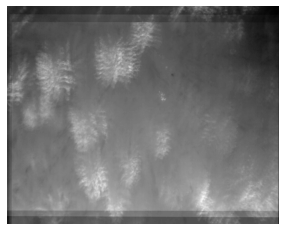

In [10]:
image_sequence, integral_image = ids[0]
ids.show_images(image_sequence, figsize=(8, 10))
ids.show_image(integral_image)

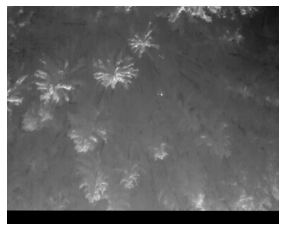

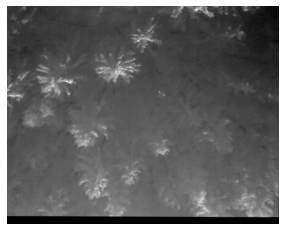

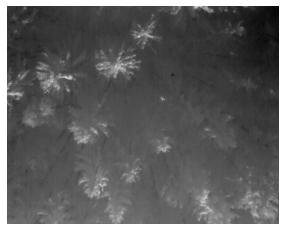

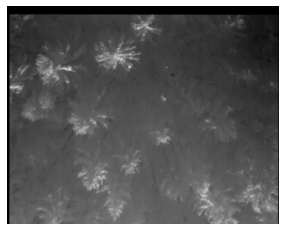

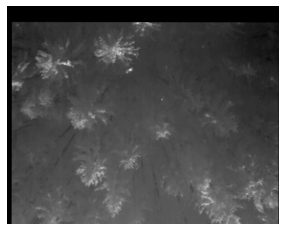

In [12]:
lane = ids.data[0]
K = ids.K
sequence_len = 5
idc = lane['annotated_image']
start = idc - sequence_len // 2
stop = start + sequence_len
pose_matrices = lane['poses'][start:stop]
images = lane['images'][start:stop]
assert len(pose_matrices) == sequence_len


image_sequence, integral_image = IntegralDataset.integrate(images, pose_matrices, K, z=30.0, verbose=True)

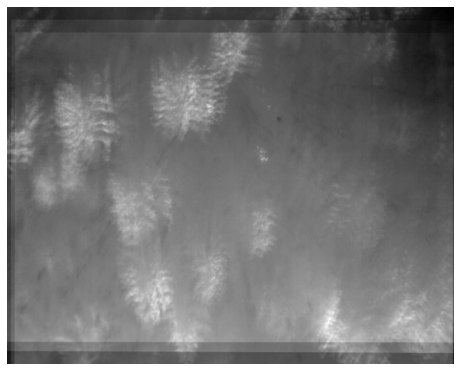

In [14]:
IntegralDataset.show_image(integral_image, figsize=(8, 10))

integral with z= 20


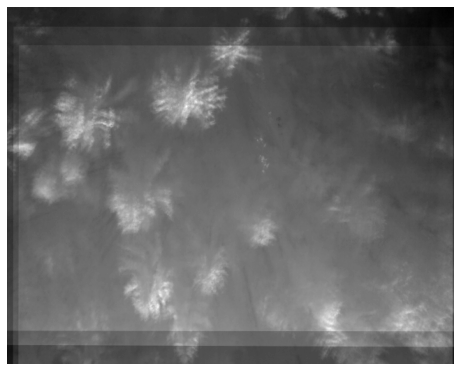

integral with z= 21


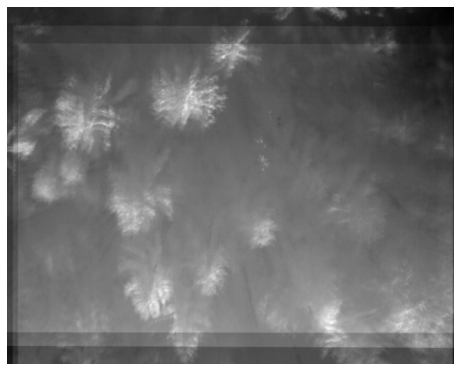

integral with z= 22


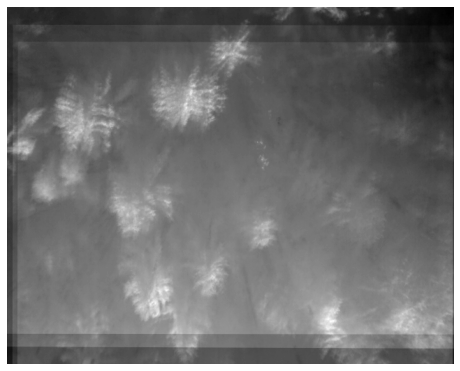

integral with z= 23


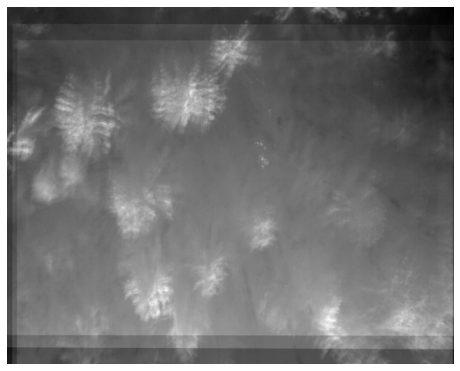

integral with z= 24


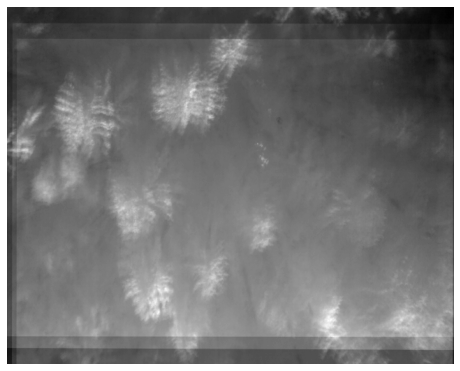

integral with z= 25


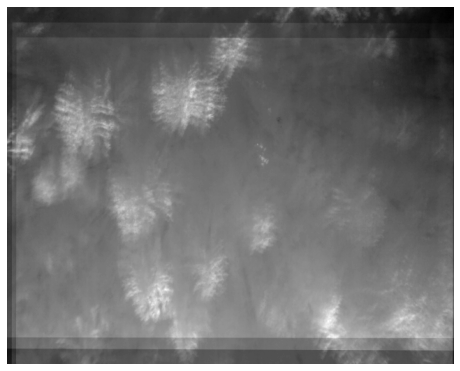

integral with z= 26


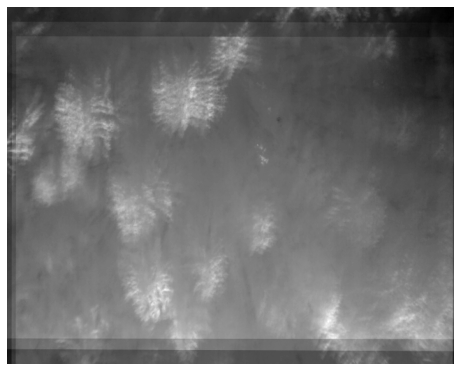

integral with z= 27


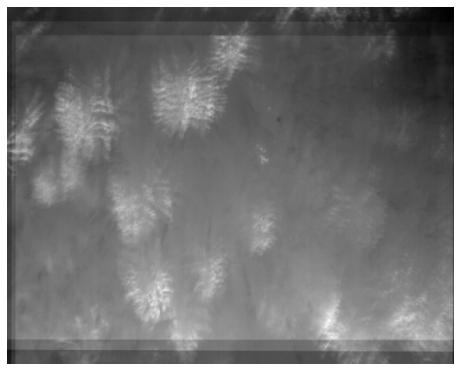

integral with z= 28


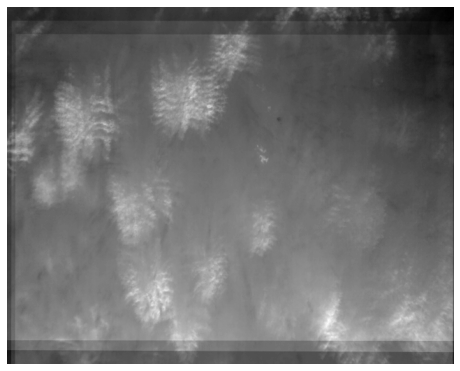

integral with z= 29


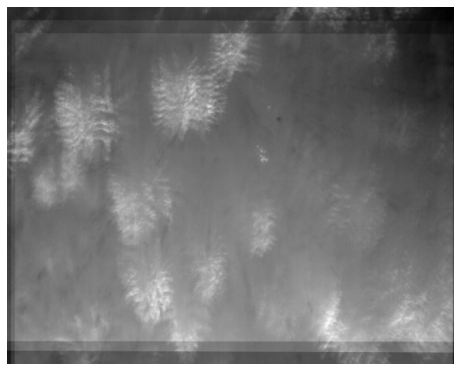

integral with z= 30


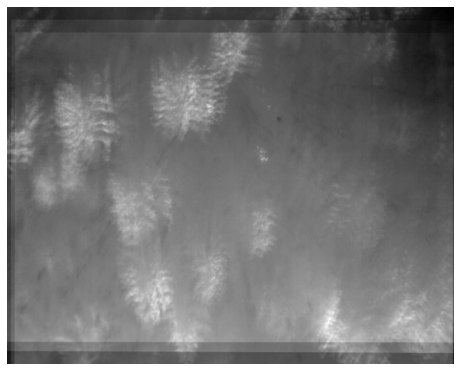

integral with z= 31


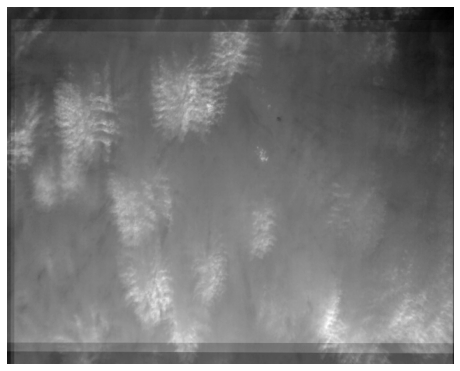

integral with z= 32


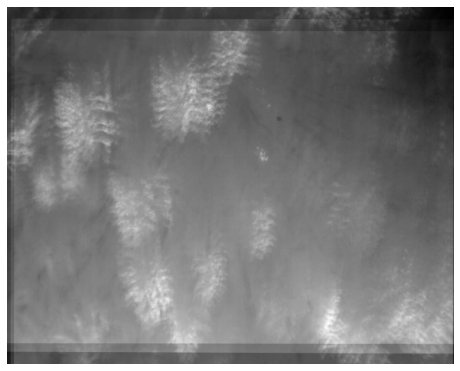

integral with z= 33


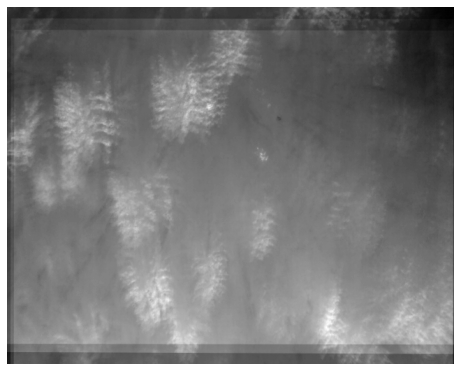

integral with z= 34


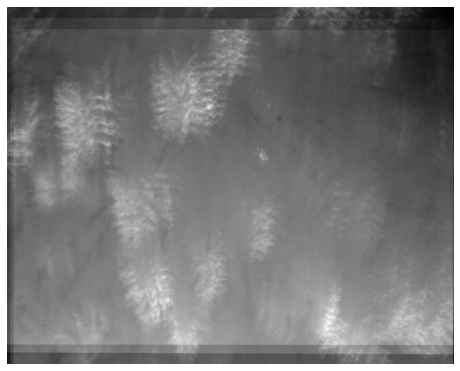

integral with z= 35


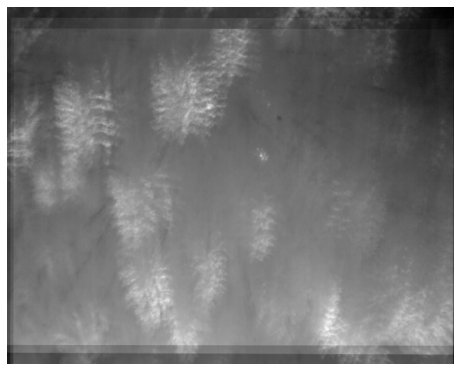

integral with z= 36


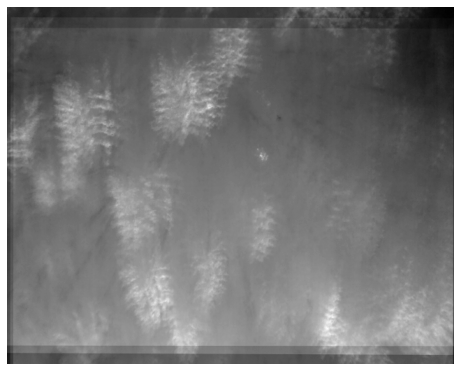

integral with z= 37


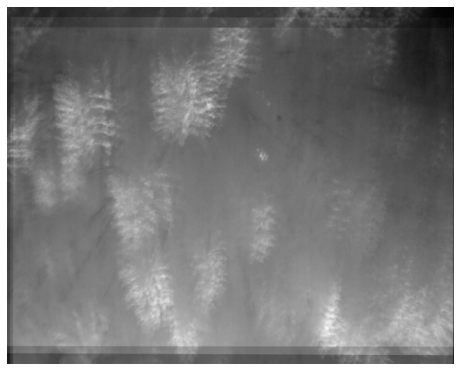

integral with z= 38


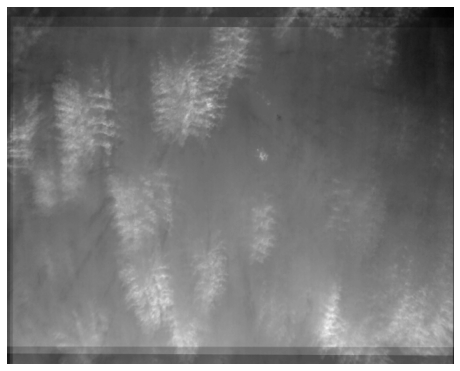

integral with z= 39


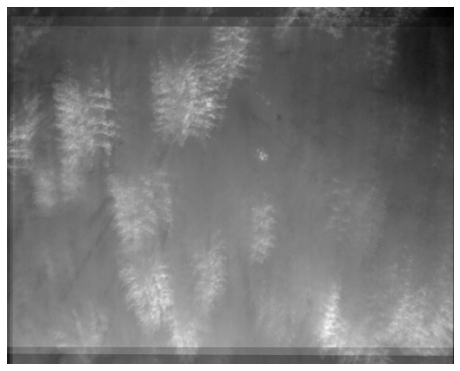

In [15]:
# may height incorrect? 
for z in np.arange(20, 40, 1):
    _, integral_image = IntegralDataset.integrate(images, pose_matrices, K, z=z, verbose=False)
    print('integral with z=', z)
    IntegralDataset.show_image(integral_image, figsize=(8, 10))

integral with z= 5


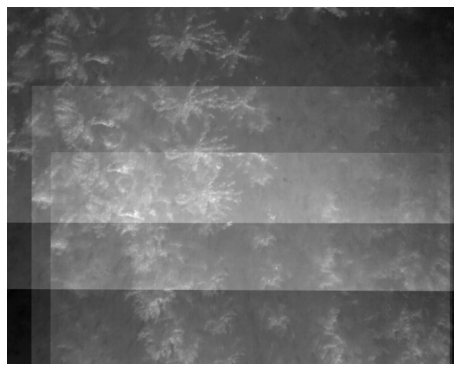

integral with z= 6


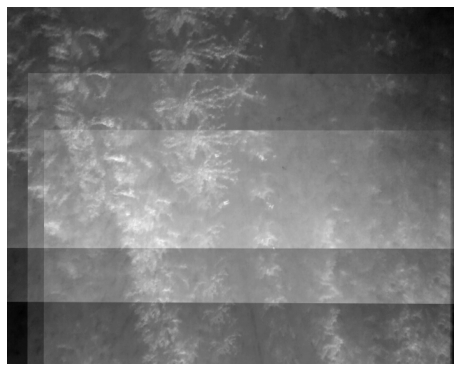

integral with z= 7


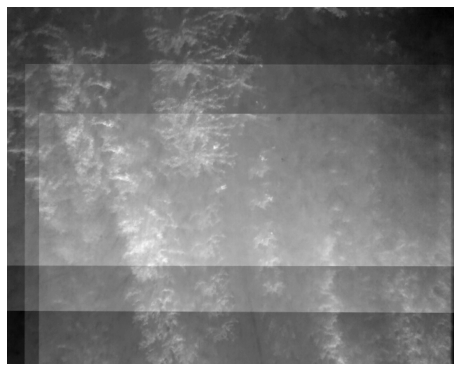

integral with z= 8


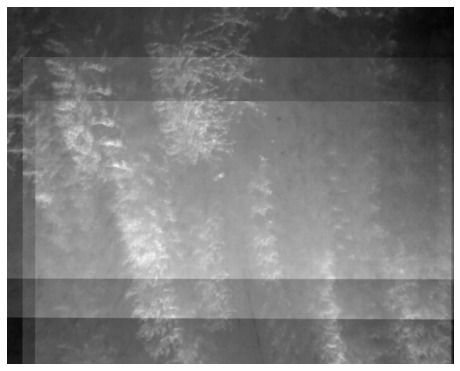

integral with z= 9


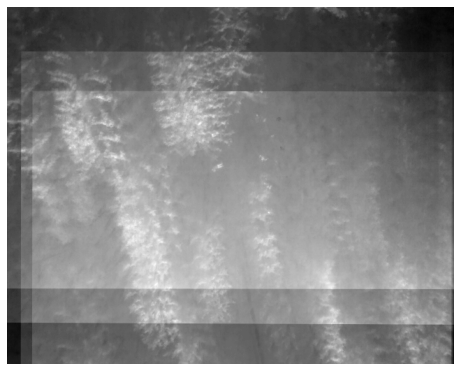

integral with z= 10


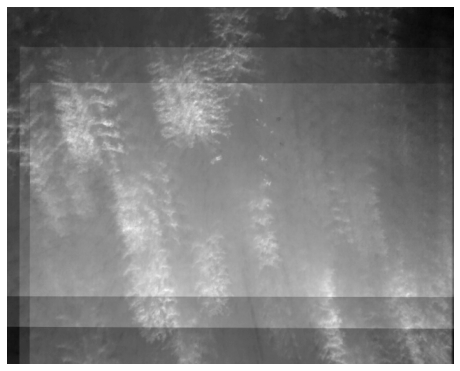

integral with z= 11


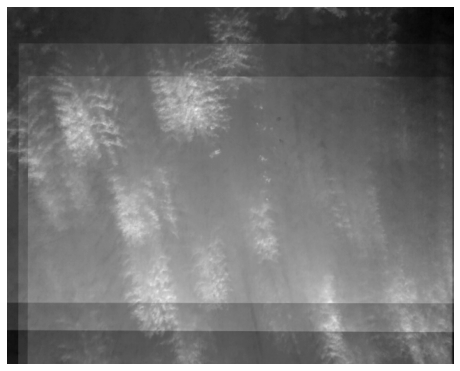

integral with z= 12


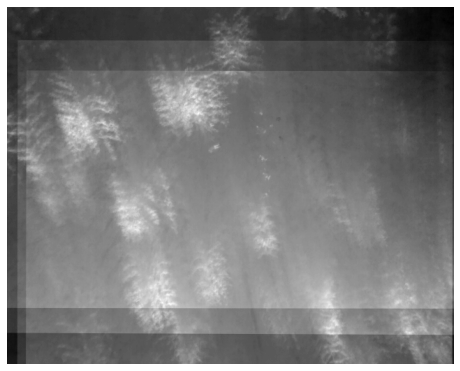

integral with z= 13


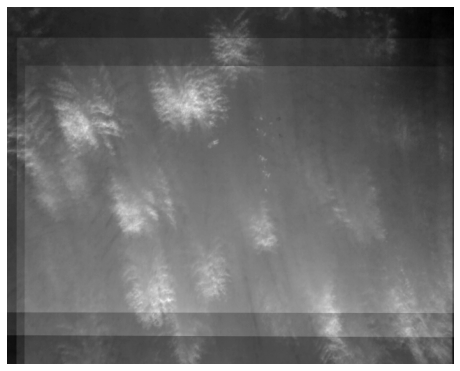

integral with z= 14


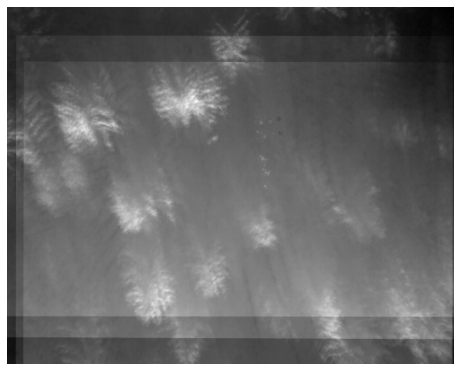

integral with z= 15


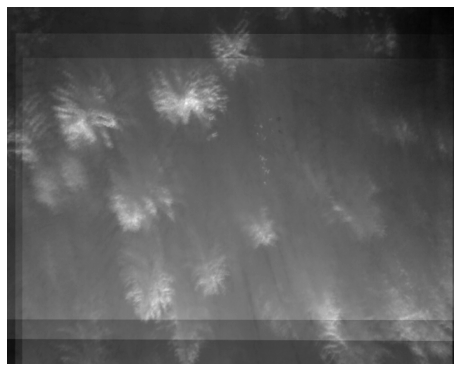

integral with z= 16


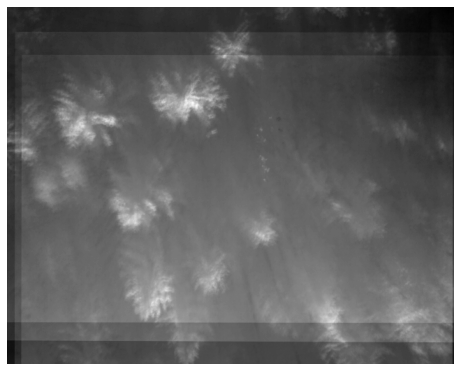

integral with z= 17


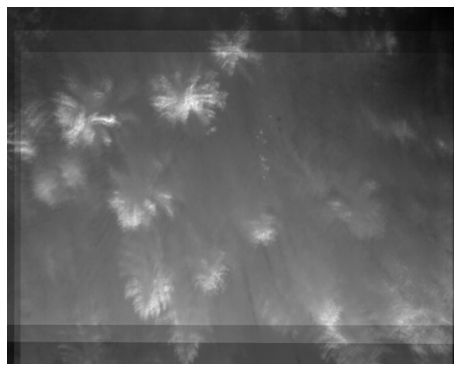

integral with z= 18


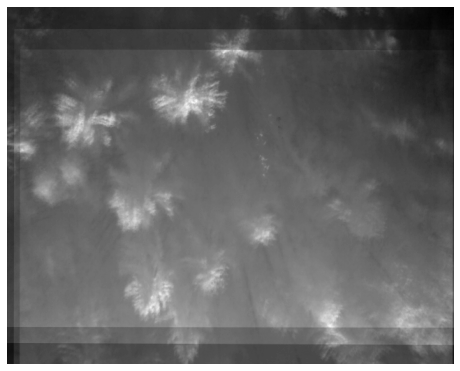

integral with z= 19


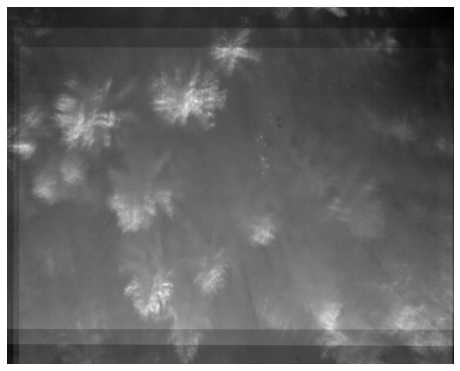

In [16]:
for z in np.arange(5, 20, 1):
    _, integral_image = IntegralDataset.integrate(images, pose_matrices, K, z=z, verbose=False)
    print('integral with z=', z)
    IntegralDataset.show_image(integral_image, figsize=(8, 10))

In [56]:
class FilterKernel(nn.Module):
    '''
    Generic Standard Computer Vision Kernel
        for Greyscale Images
    '''

    def __init__(self, k: np.ndarray, verbose=False):
        super().__init__()
        self.conv = nn.Conv2d(1, 1, 3, 1, 1, 1, 1, bias=False)
        k = torch.as_tensor(k).float().reshape(1, 1, 3, 3)
        self.verbose = verbose
        if verbose:
            print(self.conv.weight)
            print(self.conv.weight.shape)
        self.conv.weight = nn.parameter.Parameter(data=k, requires_grad=False)

    def forward(self, x):  # batch x channel x height x width
        if isinstance(x, np.ndarray):
            x = x.astype(np.float32)  # required
            x = torch.as_tensor(x).reshape(1, 1, *x.shape)
            x = self.conv(x)
            # return numpy array
            return x.reshape(*x.shape[-2:]).numpy()
        else:  # assume tensor, return tensor
            return self.conv(x)


k = np.zeros((3, 3))
k[1, 1] = 1
test = FilterKernel(k, verbose=True)
print(test.conv.weight)
test_data = np.arange(25).reshape(5, 5).astype(np.float32)
res = test(test_data)
res

Parameter containing:
tensor([[[[ 0.0978, -0.0512,  0.2914],
          [-0.3197, -0.0152,  0.2496],
          [-0.0793, -0.1415,  0.0114]]]], requires_grad=True)
torch.Size([1, 1, 3, 3])
Parameter containing:
tensor([[[[0., 0., 0.],
          [0., 1., 0.],
          [0., 0., 0.]]]])


array([[ 0.,  1.,  2.,  3.,  4.],
       [ 5.,  6.,  7.,  8.,  9.],
       [10., 11., 12., 13., 14.],
       [15., 16., 17., 18., 19.],
       [20., 21., 22., 23., 24.]], dtype=float32)

In [85]:
def show_kernel_effect(images, kernel, figsize=(8, 10)):
    fig, axs = plt.subplots(nrows=len(images), ncols=2, figsize=figsize)
    for ax in axs.reshape(-1):
        ax.axis('off')
    for i, image in enumerate(images):
        filtered = kernel(image)
        if len(images) > 1:
            axs[i, 0].imshow(image, cmap='gray')
            axs[i, 1].imshow(filtered, cmap='gray')
        else:
            axs[0].imshow(image, cmap='gray')
            axs[1].imshow(filtered, cmap='gray')

    fig.tight_layout()
    plt.show()


def show_kernel_on_integrals(images, kernel, zs=[30.0]):
    integrals = []
    for z in zs:
        _, integral = IntegralDataset.integrate(images, pose_matrices, K, z=z, verbose=False)
        integrals.append(integral)

    show_kernel_effect(integrals, kernel)

In [90]:
# Sharpen
sharp = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])
sharp = FilterKernel(sharp)

# Blurr
blurr = np.ones((3, 3)) / 9
blurr = FilterKernel(blurr)

# Outline
outline = np.array([
    [-1, -1, -1],
    [-1, 8, -1],
    [-1, -1, -1]
])
outline = FilterKernel(outline)

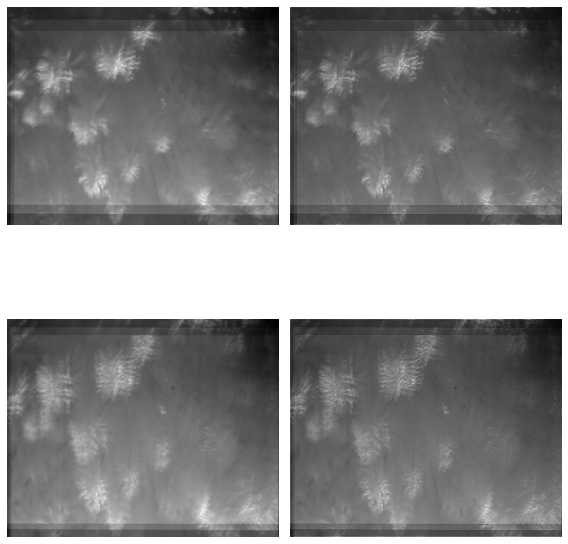

In [87]:
show_kernel_on_integrals(images, sharp, zs=[20, 30])

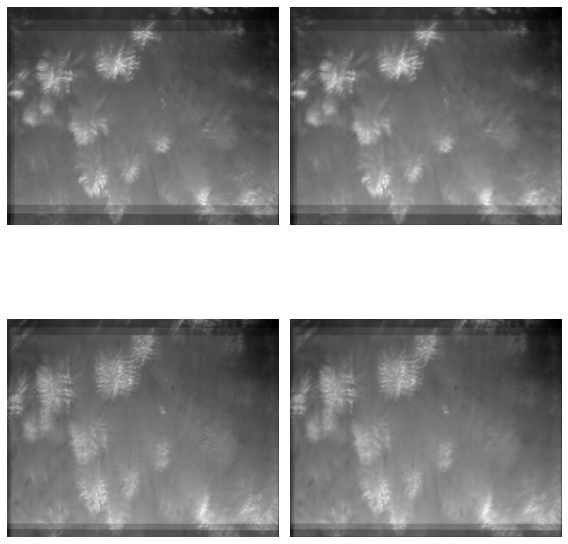

In [91]:
show_kernel_on_integrals(images, blurr, zs=[20, 30])

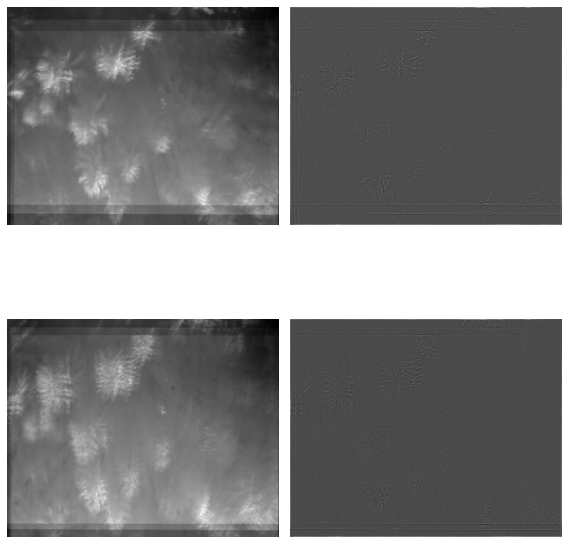

In [89]:
show_kernel_on_integrals(images, outline, zs=[20, 30])